In [1]:
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import numpy as np
import scipy.io as sio 
import matplotlib.cm as cm

In [2]:
plt.rcParams['figure.figsize'] = [8.0, 4.0]
plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300

plt.rcParams['font.size'] = 10
plt.rcParams['legend.fontsize'] = 'medium'
plt.rcParams['lines.linewidth'] = 1

In [3]:
def add_input_file(dd, filename, label):
	f = filename
	p = dict()
	sio.loadmat(f, mdict=p)
	dd[label] = p	
	print '\tAdded output data from ', filename, '\t dictionary key: ', label
	return dd

In [4]:
# Create dd dictionary
dd = dict()

Case = 'V'
#Case = 'H'

if Case is 'V':
    dd = add_input_file(dd, '08_Optimised_V_624_Joho/output/output.mat', 'Joho_Optimised')
    dd = add_input_file(dd, '07_Optimised_V_624_Gaussian/output/output.mat', 'Gaussian_Optimised')
    dd = add_input_file(dd, '06_Optimised_V_624_Tomo/output/output.mat', 'Tomo_Optimised')
    dd = add_input_file(dd, '02_Original_V_624_Joho/output/output.mat', 'Joho_Original')
    dd = add_input_file(dd, '01_Original_V_624_Gaussian/output/output.mat', 'Gaussian_Original')
    dd = add_input_file(dd, '00_Original_V_624_Tomo/output/output.mat', 'Tomo_Original')
elif Case is 'H':
    dd = add_input_file(dd, '11_Optimised_H_621_Joho/output/output.mat', 'Joho_Optimised')
    dd = add_input_file(dd, '10_Optimised_H_621_Gaussian/output/output.mat', 'Gaussian_Optimised')
    dd = add_input_file(dd, '09_Optimised_H_621_Tomo/output/output.mat', 'Tomo_Optimised')
    dd = add_input_file(dd, '05_Original_H_621_Joho/output/output.mat', 'Joho_Original')
    dd = add_input_file(dd, '04_Original_H_621_Gaussian/output/output.mat', 'Gaussian_Original')
    dd = add_input_file(dd, '03_Original_H_621_Tomo/output/output.mat', 'Tomo_Original')
else: 
    print 'Case not recognised, options are \'V\' or \'H\'. Exiting'
    exit(0)
    
sc = 'SbS'
main_label = 'Nmp=50000_Tests'
main_label2 = main_label + '_zoom'
scaled_label = main_label + '_scaled'
legend_label = 'case'
turn_tot = None
zoom_turns = 15
turns = [0, 1, 10, 50, 100, 874, 2185, 2199]
betagamma = 2.492104532 * 0.9159915293879255

	Added output data from  08_Optimised_V_624_Joho/output/output.mat 	 dictionary key:  Joho_Optimised
	Added output data from  07_Optimised_V_624_Gaussian/output/output.mat 	 dictionary key:  Gaussian_Optimised
	Added output data from  06_Optimised_V_624_Tomo/output/output.mat 	 dictionary key:  Tomo_Optimised
	Added output data from  02_Original_V_624_Joho/output/output.mat 	 dictionary key:  Joho_Original
	Added output data from  01_Original_V_624_Gaussian/output/output.mat 	 dictionary key:  Gaussian_Original
	Added output data from  00_Original_V_624_Tomo/output/output.mat 	 dictionary key:  Tomo_Original


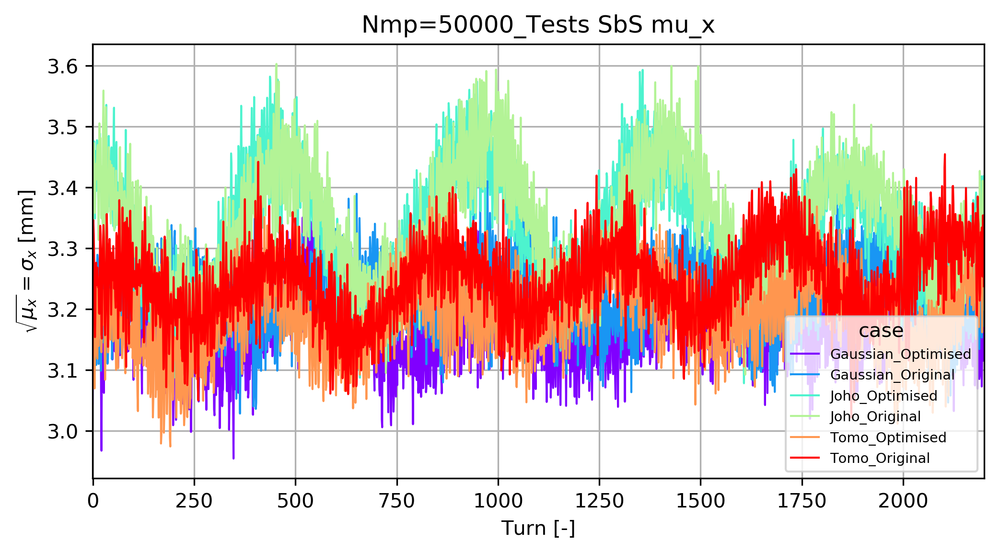

In [5]:
parameter = 'mu_x'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label + ' ' + sc + ' ' + parameter
ax1.set_title(tit);

ax1.set_ylabel(r'$\sqrt{\mu_x} = \sigma_x$ [mm]');
ax1.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd.keys())))
c_it = int(0)

for key, value in sorted(dd.iteritems()):
        ax1.plot(dd[key]['turn'][0], np.sqrt(dd[key][parameter][0])*1000, label=key, color=colors[c_it]);
        c_it = c_it + 1
        
ax1.legend(fontsize='x-small', loc=4, title=legend_label)
ax1.grid()
ax1.set_xlim(-1,2200)

parameter = 'sigma_x'
savename = 'Plots/Param_' + parameter + '_V.png'
plt.savefig(savename, dpi = 800);

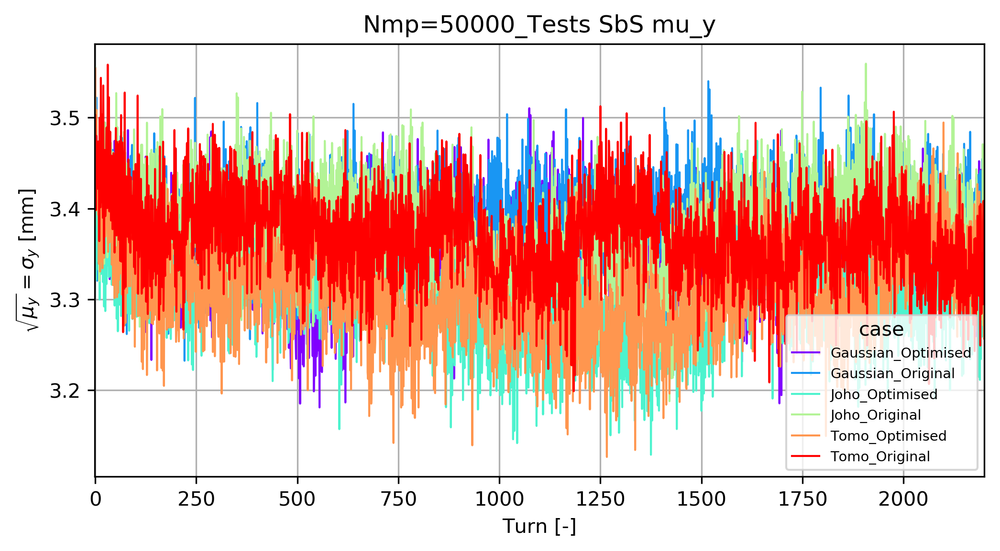

In [6]:
parameter = 'mu_y'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label + ' ' + sc + ' ' + parameter
ax1.set_title(tit);

ax1.set_ylabel(r'$\sqrt{\mu_y} = \sigma_y$ [mm]');
ax1.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd.keys())))
c_it = int(0)

for key, value in sorted(dd.iteritems()):
        ax1.plot(dd[key]['turn'][0], np.sqrt(dd[key][parameter][0])*1000, label=key, color=colors[c_it]);
        c_it = c_it + 1
        
ax1.legend(fontsize='x-small', loc=4, title=legend_label)
ax1.grid()
ax1.set_xlim(-1,2200)

parameter = 'sigma_y'
savename = 'Plots/Param_' + parameter + '_V.png'
plt.savefig(savename, dpi = 800);

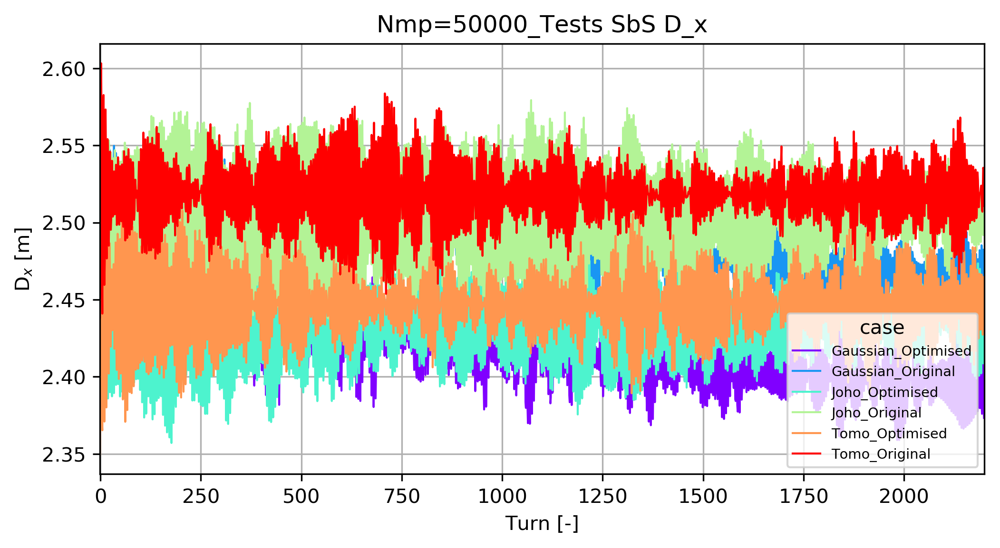

In [7]:
parameter = 'D_x'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label + ' ' + sc + ' ' + parameter
ax1.set_title(tit);

ax1.set_ylabel(r'D$_x$ [m]');
ax1.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd.keys())))
c_it = int(0)

for key, value in sorted(dd.iteritems()):
        ax1.plot(dd[key]['turn'][0], dd[key][parameter][0], label=key, color=colors[c_it]);
        c_it = c_it + 1
        
ax1.legend(fontsize='x-small', loc=4, title=legend_label)
ax1.grid()
ax1.set_xlim(-1,2200)

savename = 'Plots/Param_' + parameter + '_V.png'
plt.savefig(savename, dpi = 800);

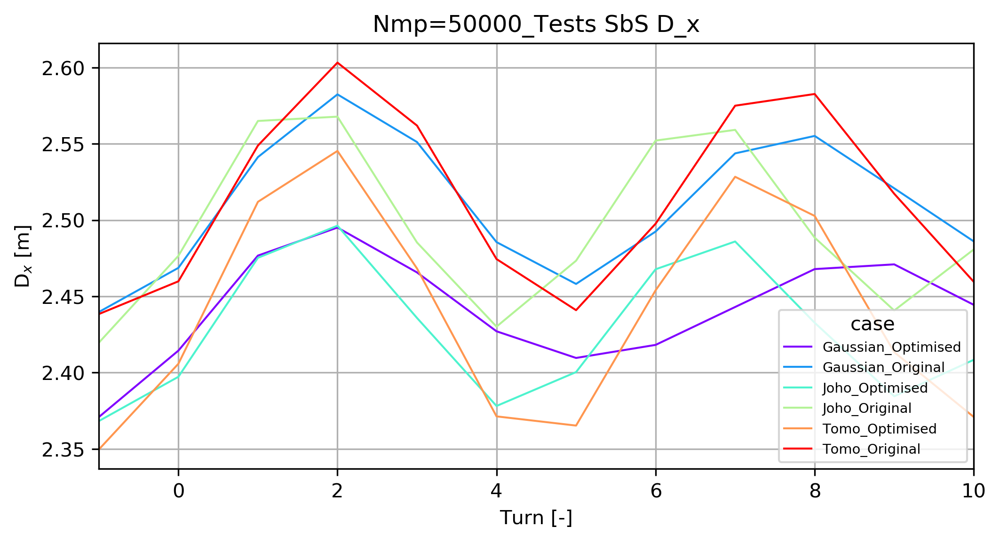

In [8]:
parameter = 'D_x'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label + ' ' + sc + ' ' + parameter
ax1.set_title(tit);

ax1.set_ylabel(r'D$_x$ [m]');
ax1.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd.keys())))
c_it = int(0)

for key, value in sorted(dd.iteritems()):
        ax1.plot(dd[key]['turn'][0], dd[key][parameter][0], label=key, color=colors[c_it]);
        c_it = c_it + 1
        
ax1.legend(fontsize='x-small', loc=4, title=legend_label);
ax1.grid();
ax1.set_xlim(-1,10);

#savename = 'Plots/Param_' + parameter + '_V.png'
#plt.savefig(savename, dpi = 800);

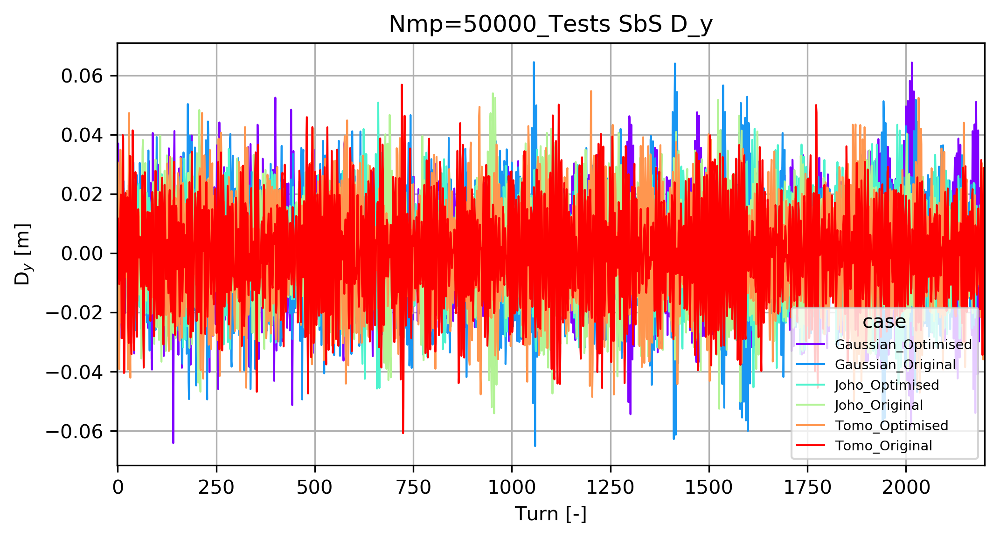

In [9]:
parameter = 'D_y'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label + ' ' + sc + ' ' + parameter
ax1.set_title(tit);

ax1.set_ylabel(r'D$_y$ [m]');
ax1.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd.keys())))
c_it = int(0)

for key, value in sorted(dd.iteritems()):
        ax1.plot(dd[key]['turn'][0], dd[key][parameter][0], label=key, color=colors[c_it]);
        c_it = c_it + 1
        
ax1.legend(fontsize='x-small', loc=4, title=legend_label)
ax1.grid()
ax1.set_xlim(-1,2200)

savename = 'Plots/Param_' + parameter + '_V.png'
plt.savefig(savename, dpi = 800);

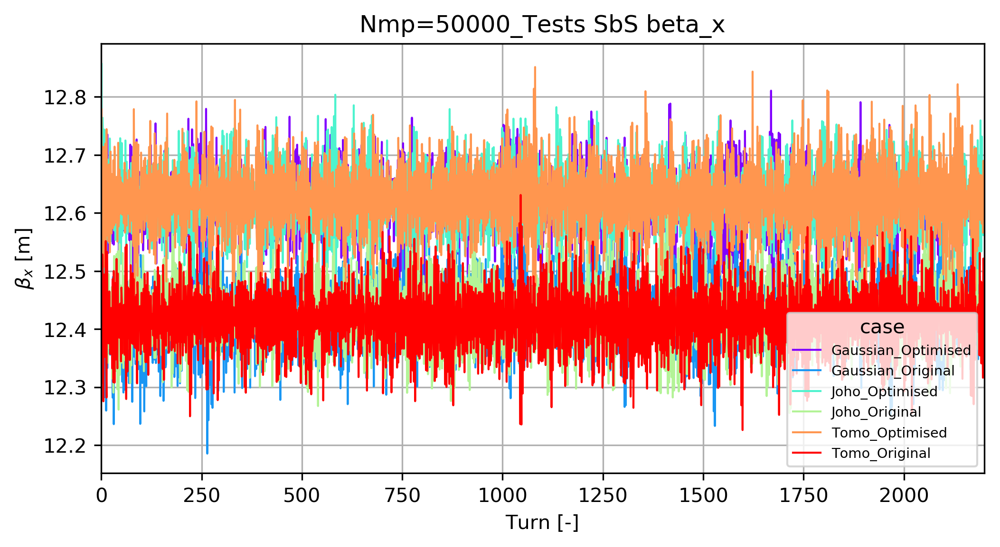

In [10]:
parameter = 'beta_x'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label + ' ' + sc + ' ' + parameter
ax1.set_title(tit);

ax1.set_ylabel(r'$\beta_x$ [m]');
ax1.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd.keys())))
c_it = int(0)

for key, value in sorted(dd.iteritems()):
        ax1.plot(dd[key]['turn'][0], dd[key][parameter][0], label=key, color=colors[c_it]);
        c_it = c_it + 1
        
ax1.legend(fontsize='x-small', loc=4, title=legend_label)
ax1.grid()
ax1.set_xlim(-1,2200)

savename = 'Plots/Param_' + parameter + '_V.png'
plt.savefig(savename, dpi = 800);

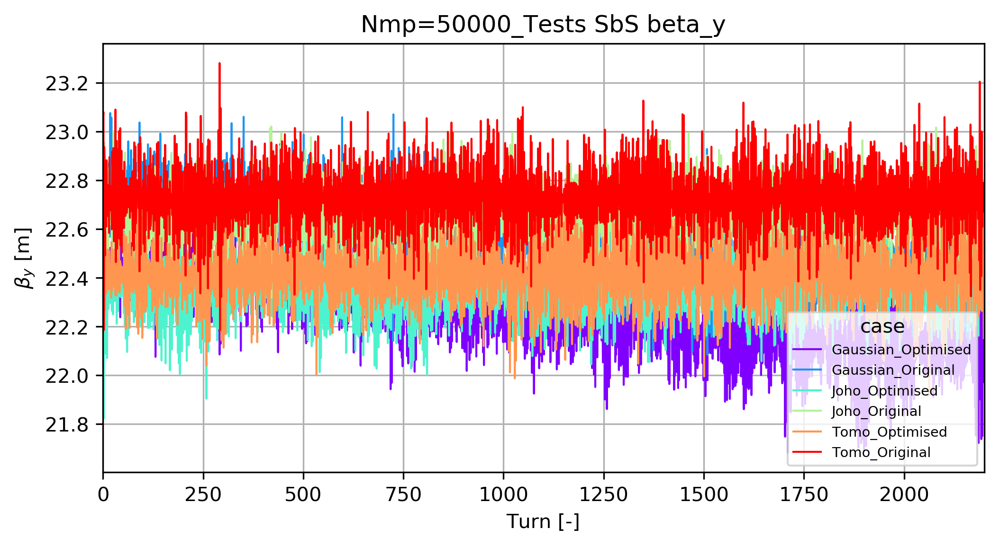

In [11]:
parameter = 'beta_y'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label + ' ' + sc + ' ' + parameter
ax1.set_title(tit);

ax1.set_ylabel(r'$\beta_y$ [m]');
ax1.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd.keys())))
c_it = int(0)

for key, value in sorted(dd.iteritems()):
        ax1.plot(dd[key]['turn'][0], dd[key][parameter][0], label=key, color=colors[c_it]);
        c_it = c_it + 1
        
ax1.legend(fontsize='x-small', loc=4, title=legend_label)
ax1.grid()
ax1.set_xlim(-1,2200)

savename = 'Plots/Param_' + parameter + '_V.png'
plt.savefig(savename, dpi = 800);

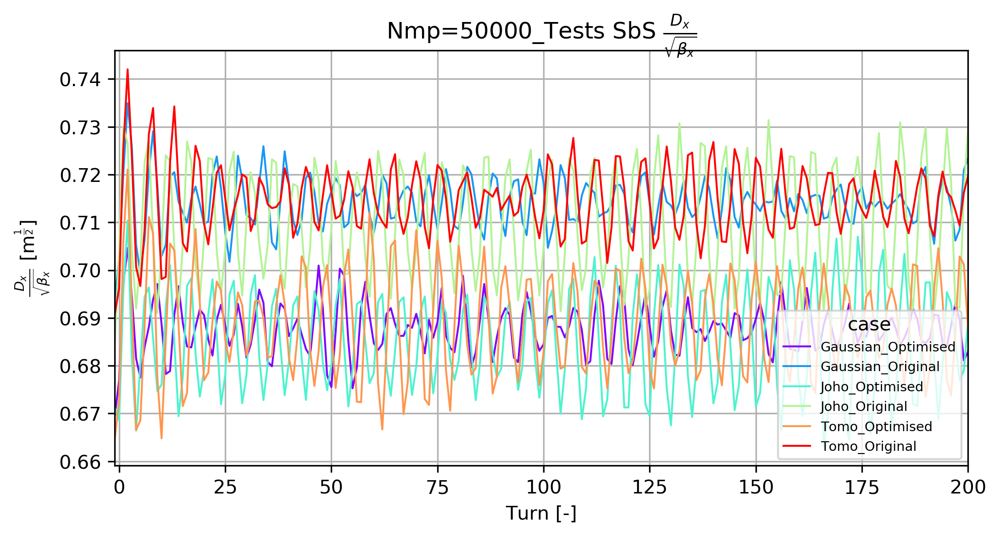

In [12]:
parameter = 'D_x'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label + ' ' + sc + ' ' + r'$\frac{D_x}{\sqrt{\beta_x}}$'
ax1.set_title(tit);

ax1.set_ylabel(r'$\frac{D_x}{\sqrt{\beta_x}}$ [m$^\frac{1}{2}$]');
ax1.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd.keys())))
c_it = int(0)

for key, value in sorted(dd.iteritems()):
        ax1.plot(dd[key]['turn'][0], dd[key]['D_x'][0]/np.sqrt(dd[key]['beta_x'][0]), label=key, color=colors[c_it]);
        c_it = c_it + 1
        
ax1.legend(fontsize='x-small', loc=4, title=legend_label)
ax1.grid()
ax1.set_xlim(-1,200)

savename = 'Plots/Param_' + parameter + '_V.png'
#plt.savefig(savename, dpi = 800);

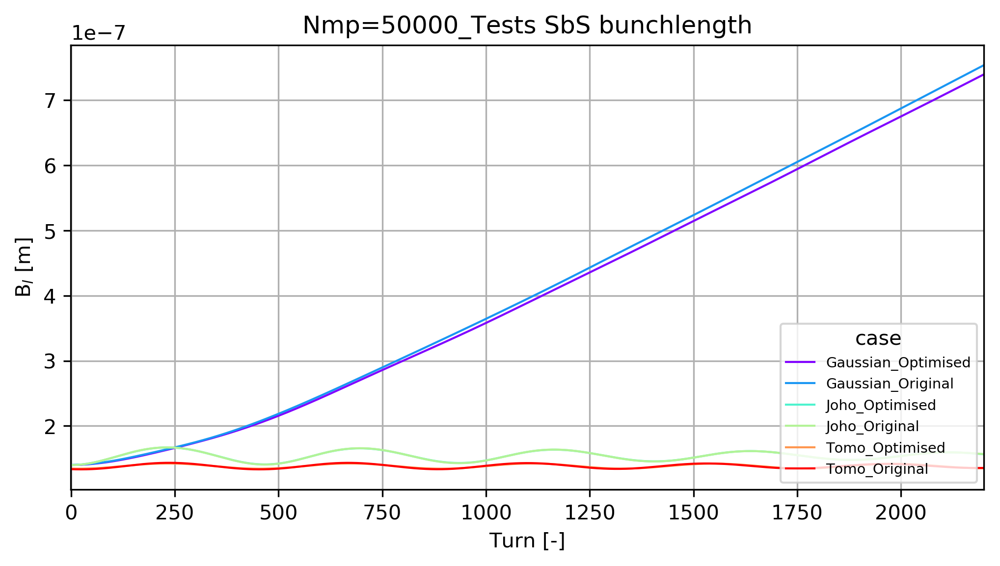

In [13]:
parameter = 'bunchlength'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label + ' ' + sc + ' ' + parameter
ax1.set_title(tit);

ax1.set_ylabel(r'B$_l$ [m]');
ax1.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd.keys())))
c_it = int(0)

for key, value in sorted(dd.iteritems()):
        ax1.plot(dd[key]['turn'][0], dd[key][parameter][0], label=key, color=colors[c_it]);
        c_it = c_it + 1
        
ax1.legend(fontsize='x-small', loc=4, title=legend_label)
ax1.grid()
ax1.set_xlim(-1,2200)
#ax1.set_ylim(1.342E-7, 1.3445E-7)

savename = 'Plots/Param_' + parameter + '_V.png'
plt.savefig(savename, dpi = 800);

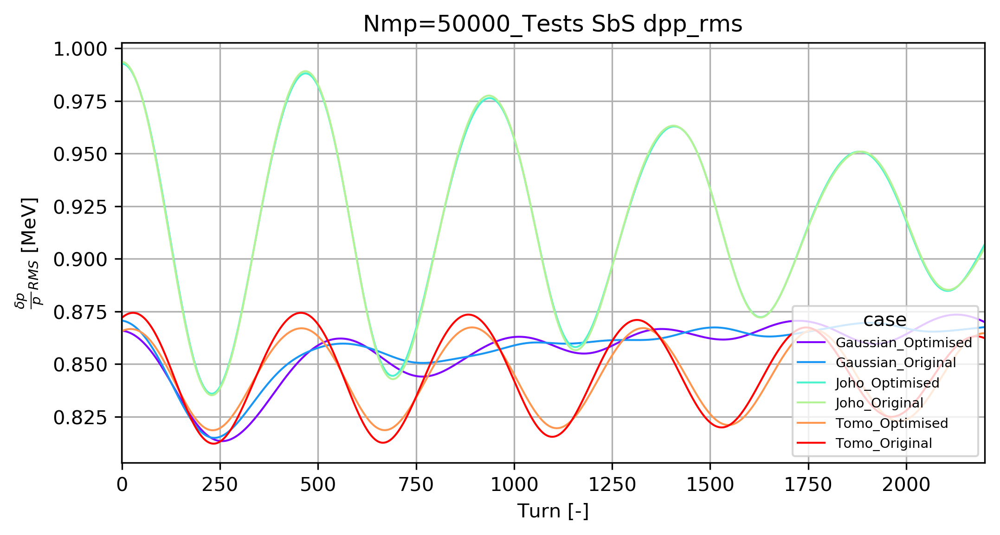

In [14]:
parameter = 'dpp_rms'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label + ' ' + sc + ' ' + parameter
ax1.set_title(tit);

ax1.set_ylabel(r'$\frac{\delta p}{p}_{RMS}$ [MeV]');
ax1.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd.keys())))
c_it = int(0)

for key, value in sorted(dd.iteritems()):
        ax1.plot(dd[key]['turn'][0], dd[key][parameter][0]*1000, label=key, color=colors[c_it]);
        c_it = c_it + 1
        
ax1.legend(fontsize='x-small', loc=4, title=legend_label)
ax1.grid()
ax1.set_xlim(-1,2200)

savename = 'Plots/Param_' + parameter + '.png'
plt.savefig(savename, dpi = 800);

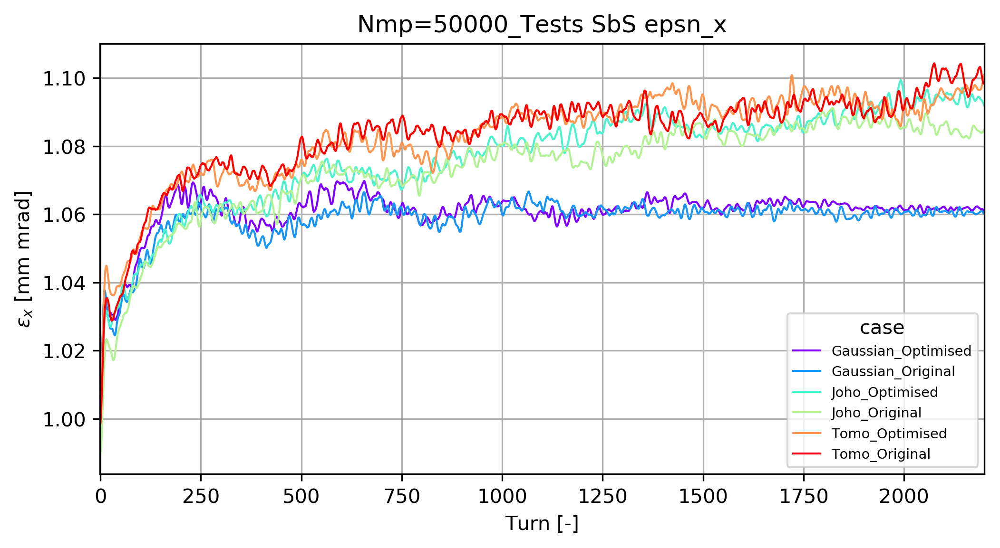

In [15]:
parameter = 'epsn_x'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label + ' ' + sc + ' ' + parameter
ax1.set_title(tit);

ax1.set_ylabel(r'$\epsilon_x$ [mm mrad]');
ax1.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd.keys())))
c_it = int(0)

for key, value in sorted(dd.iteritems()):
        ax1.plot(dd[key]['turn'][0], dd[key][parameter][0]*1E6, label=key, color=colors[c_it]);
        c_it = c_it + 1
        
ax1.legend(fontsize='x-small', loc=4, title=legend_label)
ax1.grid()
ax1.set_xlim(-1,2200)
#ax1.set_ylim(1.198, 1.21)

savename = 'Plots/Param_' + parameter + '_V.png'
plt.savefig(savename, dpi = 800);

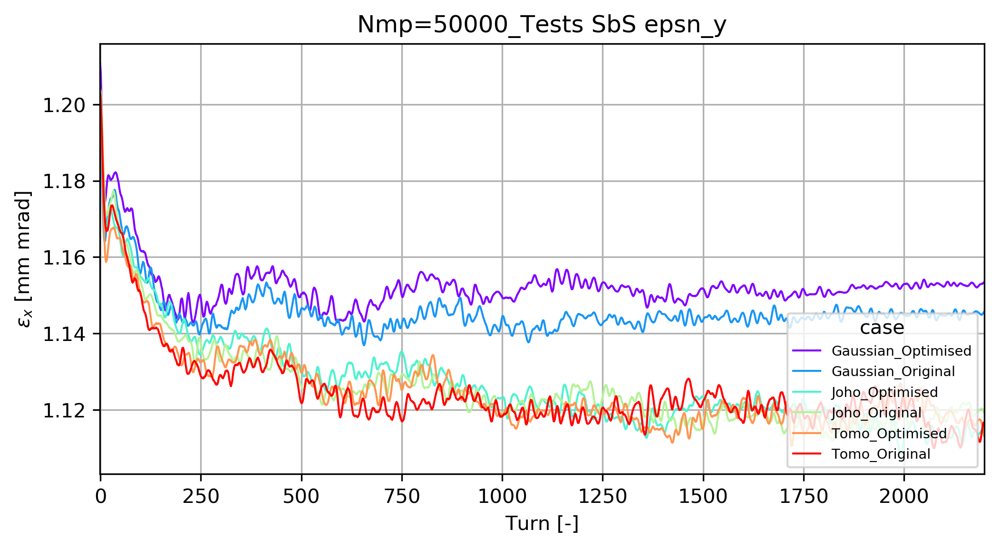

In [16]:
parameter = 'epsn_y'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label + ' ' + sc + ' ' + parameter
ax1.set_title(tit);

ax1.set_ylabel(r'$\epsilon_x$ [mm mrad]');
ax1.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd.keys())))
c_it = int(0)

for key, value in sorted(dd.iteritems()):
        ax1.plot(dd[key]['turn'][0], dd[key][parameter][0]*1E6, label=key, color=colors[c_it]);
        c_it = c_it + 1
        
ax1.legend(fontsize='x-small', loc=4, title=legend_label)
ax1.grid()
ax1.set_xlim(-1,2200)
#ax1.set_ylim(0.95, 1.25)

savename = 'Plots/Param_' + parameter + '_V.png'
plt.savefig(savename, dpi = 800);

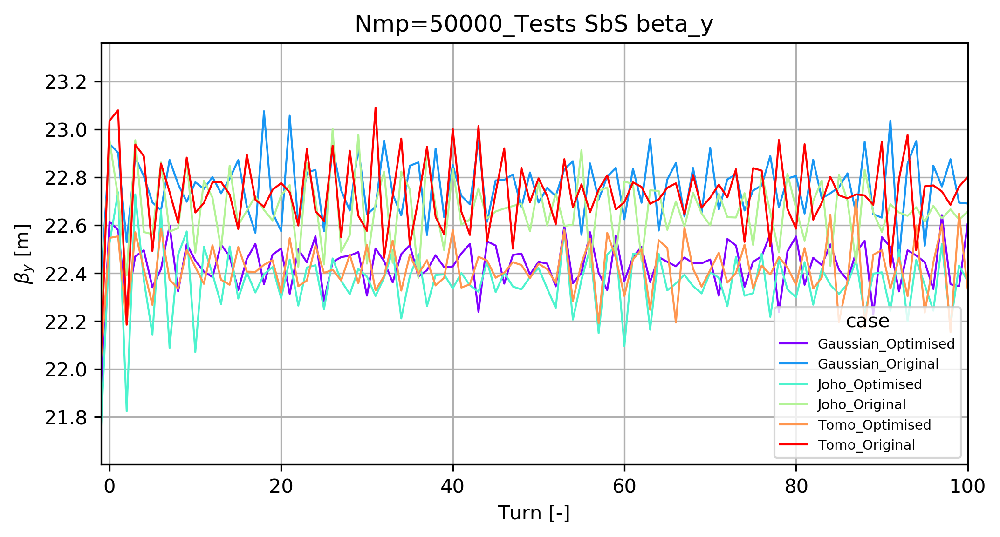

In [17]:
parameter = 'beta_y'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label + ' ' + sc + ' ' + parameter
ax1.set_title(tit);

ax1.set_ylabel(r'$\beta_y$ [m]');
ax1.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd.keys())))
c_it = int(0)

for key, value in sorted(dd.iteritems()):
        ax1.plot(dd[key]['turn'][0], dd[key][parameter][0], label=key, color=colors[c_it]);
        c_it = c_it + 1
        
ax1.legend(fontsize='x-small', loc=4, title=legend_label)
ax1.grid()
ax1.set_xlim(-1,100)

savename = 'Plots/Param_' + parameter + '.png'
plt.savefig(savename, dpi = 800);

In [18]:
# Create dd dictionary
ddh = dict()

#Case = 'V'
Case = 'H'

if Case is 'V':
    ddh = add_input_file(ddh, '08_Optimised_V_624_Joho/output/output.mat', 'Joho_Optimised')
    ddh = add_input_file(ddh, '07_Optimised_V_624_Gaussian/output/output.mat', 'Gaussian_Optimised')
    ddh = add_input_file(ddh, '06_Optimised_V_624_Tomo/output/output.mat', 'Tomo_Optimised')
    ddh = add_input_file(ddh, '02_Original_V_624_Joho/output/output.mat', 'Joho_Original')
    ddh = add_input_file(ddh, '01_Original_V_624_Gaussian/output/output.mat', 'Gaussian_Original')
    ddh = add_input_file(ddh, '00_Original_V_624_Tomo/output/output.mat', 'Tomo_Original')
elif Case is 'H':
    ddh = add_input_file(ddh, '11_Optimised_H_621_Joho/output/output.mat', 'Joho_Optimised')
    ddh = add_input_file(ddh, '10_Optimised_H_621_Gaussian/output/output.mat', 'Gaussian_Optimised')
    ddh = add_input_file(ddh, '09_Optimised_H_621_Tomo/output/output.mat', 'Tomo_Optimised')
    ddh = add_input_file(ddh, '05_Original_H_621_Joho/output/output.mat', 'Joho_Original')
    ddh = add_input_file(ddh, '04_Original_H_621_Gaussian/output/output.mat', 'Gaussian_Original')
    dhd = add_input_file(ddh, '03_Original_H_621_Tomo/output/output.mat', 'Tomo_Original')
else: 
    print 'Case not recognised, options are \'V\' or \'H\'. Exiting'
    exit(0)
    
sc = 'SbS'
main_label = 'Nmp=50000_Tests'
main_label2 = main_label + '_zoom'
scaled_label = main_label + '_scaled'
legend_label = 'case'
turn_tot = None
zoom_turns = 15
turns = [0, 1, 10, 50, 100, 874, 2185, 2199]
betagamma = 2.492104532 * 0.9159915293879255

	Added output data from  11_Optimised_H_621_Joho/output/output.mat 	 dictionary key:  Joho_Optimised
	Added output data from  10_Optimised_H_621_Gaussian/output/output.mat 	 dictionary key:  Gaussian_Optimised
	Added output data from  09_Optimised_H_621_Tomo/output/output.mat 	 dictionary key:  Tomo_Optimised
	Added output data from  05_Original_H_621_Joho/output/output.mat 	 dictionary key:  Joho_Original
	Added output data from  04_Original_H_621_Gaussian/output/output.mat 	 dictionary key:  Gaussian_Original
	Added output data from  03_Original_H_621_Tomo/output/output.mat 	 dictionary key:  Tomo_Original


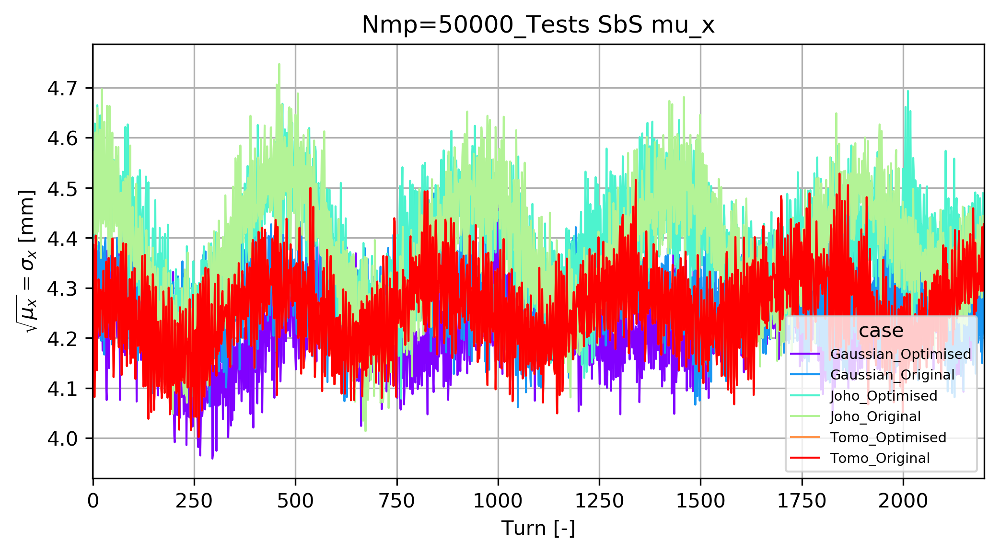

In [19]:
parameter = 'mu_x'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label + ' ' + sc + ' ' + parameter
ax1.set_title(tit);

ax1.set_ylabel(r'$\sqrt{\mu_x} = \sigma_x$ [mm]');
ax1.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(ddh.keys())))
c_it = int(0)

for key, value in sorted(ddh.iteritems()):
        ax1.plot(ddh[key]['turn'][0], np.sqrt(ddh[key][parameter][0])*1000, label=key, color=colors[c_it]);
        c_it = c_it + 1
        
ax1.legend(fontsize='x-small', loc=4, title=legend_label)
ax1.grid()
ax1.set_xlim(-1,2200)

parameter = 'sigma_x'
savename = 'Plots/Param_' + parameter + '_H.png'
plt.savefig(savename, dpi = 800);

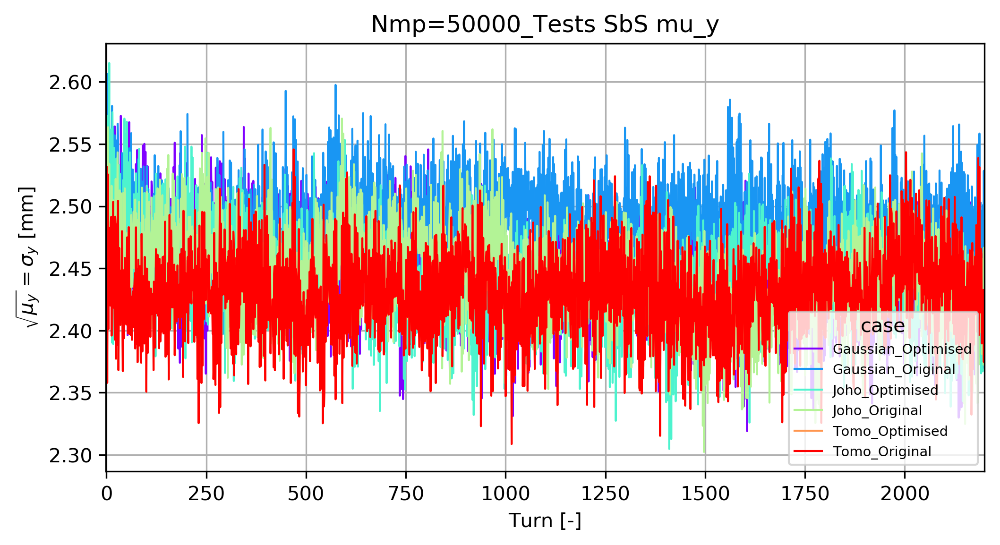

In [20]:
parameter = 'mu_y'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label + ' ' + sc + ' ' + parameter
ax1.set_title(tit);

ax1.set_ylabel(r'$\sqrt{\mu_y} = \sigma_y$ [mm]');
ax1.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(ddh.keys())))
c_it = int(0)

for key, value in sorted(ddh.iteritems()):
        ax1.plot(ddh[key]['turn'][0], np.sqrt(ddh[key][parameter][0])*1000, label=key, color=colors[c_it]);
        c_it = c_it + 1
        
ax1.legend(fontsize='x-small', loc=4, title=legend_label)
ax1.grid()
ax1.set_xlim(-1,2200)

parameter = 'sigma_y'
savename = 'Plots/Param_' + parameter + '_H.png'
plt.savefig(savename, dpi = 800);

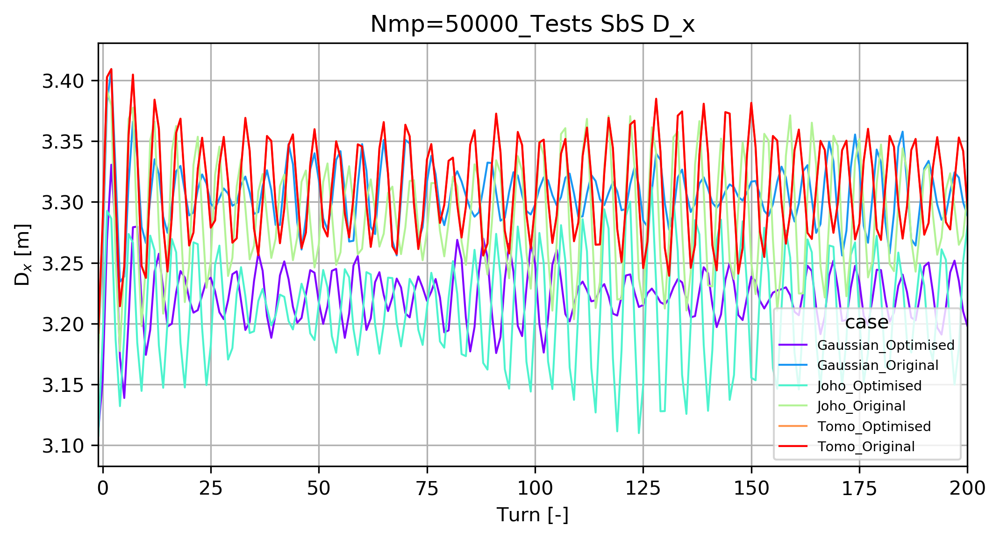

In [21]:
parameter = 'D_x'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label + ' ' + sc + ' ' + parameter
ax1.set_title(tit);

ax1.set_ylabel(r'D$_x$ [m]');
ax1.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd.keys())))
c_it = int(0)

for key, value in sorted(ddh.iteritems()):
        ax1.plot(ddh[key]['turn'][0], ddh[key][parameter][0], label=key, color=colors[c_it]);
        c_it = c_it + 1
        
ax1.legend(fontsize='x-small', loc=4, title=legend_label)
ax1.grid()
ax1.set_xlim(-1,200)

savename = 'Plots/Param_' + parameter + '_H.png'
plt.savefig(savename, dpi = 800);

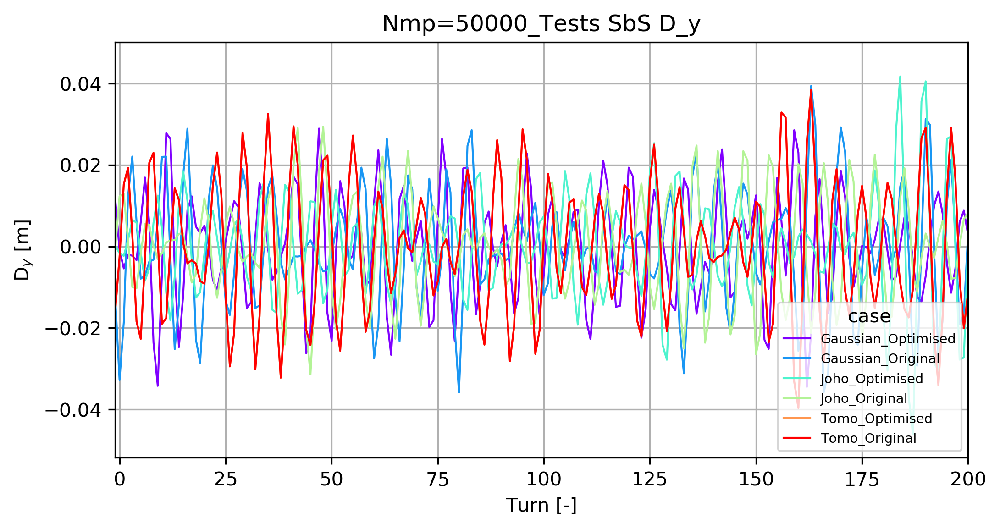

In [22]:
parameter = 'D_y'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label + ' ' + sc + ' ' + parameter
ax1.set_title(tit);

ax1.set_ylabel(r'D$_y$ [m]');
ax1.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd.keys())))
c_it = int(0)

for key, value in sorted(ddh.iteritems()):
        ax1.plot(ddh[key]['turn'][0], ddh[key][parameter][0], label=key, color=colors[c_it]);
        c_it = c_it + 1
        
ax1.legend(fontsize='x-small', loc=4, title=legend_label)
ax1.grid()
ax1.set_xlim(-1,200)

savename = 'Plots/Param_' + parameter + '_H.png'
plt.savefig(savename, dpi = 800);

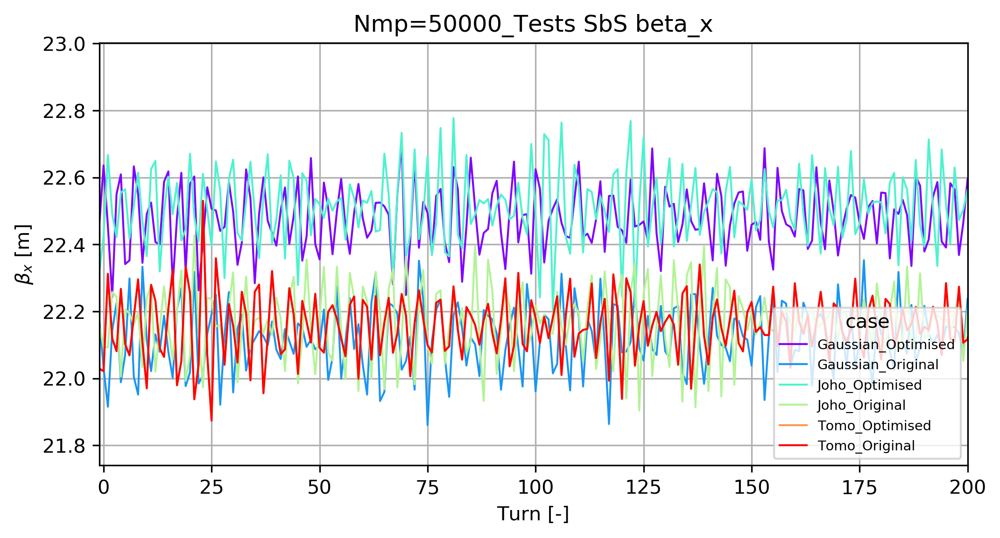

In [23]:
parameter = 'beta_x'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label + ' ' + sc + ' ' + parameter
ax1.set_title(tit);

ax1.set_ylabel(r'$\beta_x$ [m]');
ax1.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd.keys())))
c_it = int(0)

for key, value in sorted(ddh.iteritems()):
        ax1.plot(ddh[key]['turn'][0], ddh[key][parameter][0], label=key, color=colors[c_it]);
        c_it = c_it + 1
        
ax1.legend(fontsize='x-small', loc=4, title=legend_label)
ax1.grid()
ax1.set_xlim(-1,200)

savename = 'Plots/Param_' + parameter + '_H.png'
plt.savefig(savename, dpi = 800);

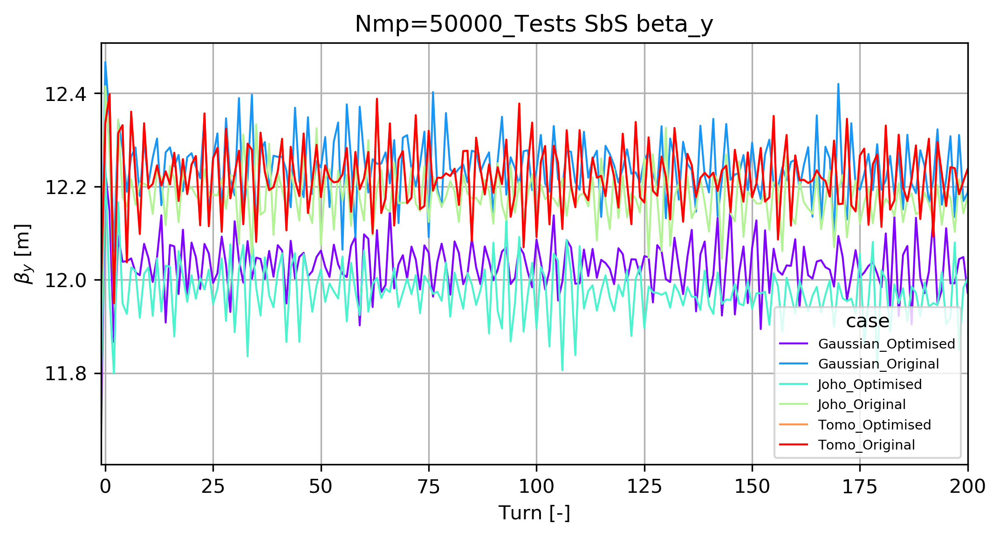

In [24]:
parameter = 'beta_y'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label + ' ' + sc + ' ' + parameter
ax1.set_title(tit);

ax1.set_ylabel(r'$\beta_y$ [m]');
ax1.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd.keys())))
c_it = int(0)

for key, value in sorted(ddh.iteritems()):
        ax1.plot(ddh[key]['turn'][0], ddh[key][parameter][0], label=key, color=colors[c_it]);
        c_it = c_it + 1
        
ax1.legend(fontsize='x-small', loc=4, title=legend_label)
ax1.grid()
ax1.set_xlim(-1,200)

savename = 'Plots/Param_' + parameter + '_H.png'
plt.savefig(savename, dpi = 800);

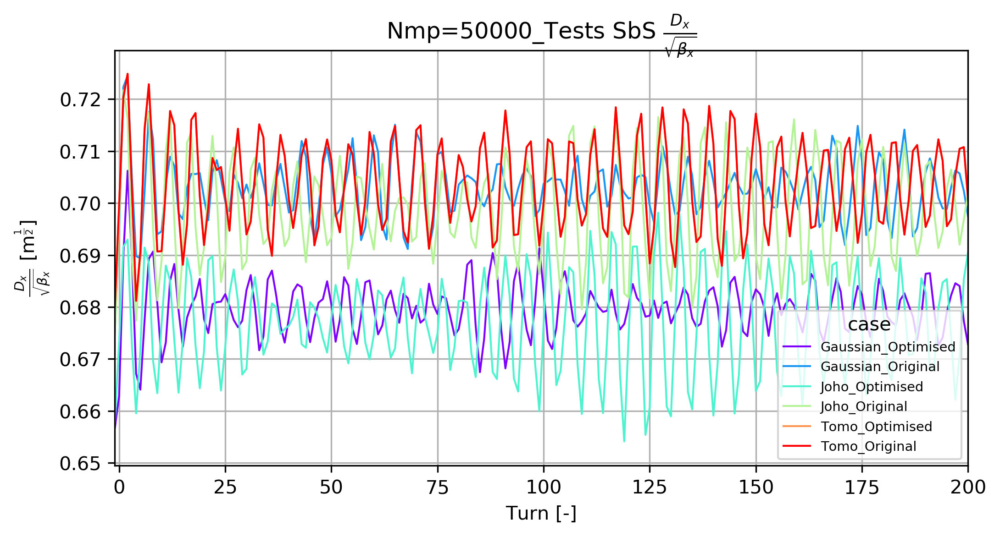

In [25]:
parameter = 'D_x'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label + ' ' + sc + ' ' + r'$\frac{D_x}{\sqrt{\beta_x}}$'
ax1.set_title(tit);

ax1.set_ylabel(r'$\frac{D_x}{\sqrt{\beta_x}}$ [m$^\frac{1}{2}$]');
ax1.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd.keys())))
c_it = int(0)

for key, value in sorted(ddh.iteritems()):
        ax1.plot(ddh[key]['turn'][0], ddh[key]['D_x'][0]/np.sqrt(ddh[key]['beta_x'][0]), label=key, color=colors[c_it]);
        c_it = c_it + 1
        
ax1.legend(fontsize='x-small', loc=4, title=legend_label)
ax1.grid()
ax1.set_xlim(-1,200)

savename = 'Plots/Param_' + parameter + '_H.png'
#plt.savefig(savename, dpi = 800);

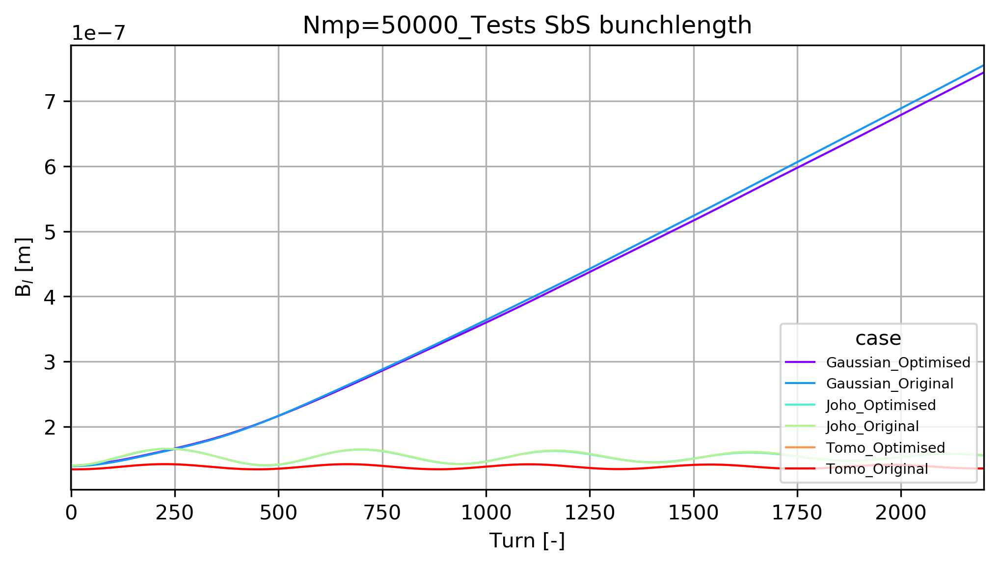

In [26]:
parameter = 'bunchlength'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label + ' ' + sc + ' ' + parameter
ax1.set_title(tit);

ax1.set_ylabel(r'B$_l$ [m]');
ax1.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd.keys())))
c_it = int(0)

for key, value in sorted(ddh.iteritems()):
        ax1.plot(ddh[key]['turn'][0], ddh[key][parameter][0], label=key, color=colors[c_it]);
        c_it = c_it + 1
        
ax1.legend(fontsize='x-small', loc=4, title=legend_label)
ax1.grid()
ax1.set_xlim(-1,2200)
#ax1.set_ylim(1.342E-7, 1.3445E-7)

savename = 'Plots/Param_' + parameter + '_H.png'
plt.savefig(savename, dpi = 800);

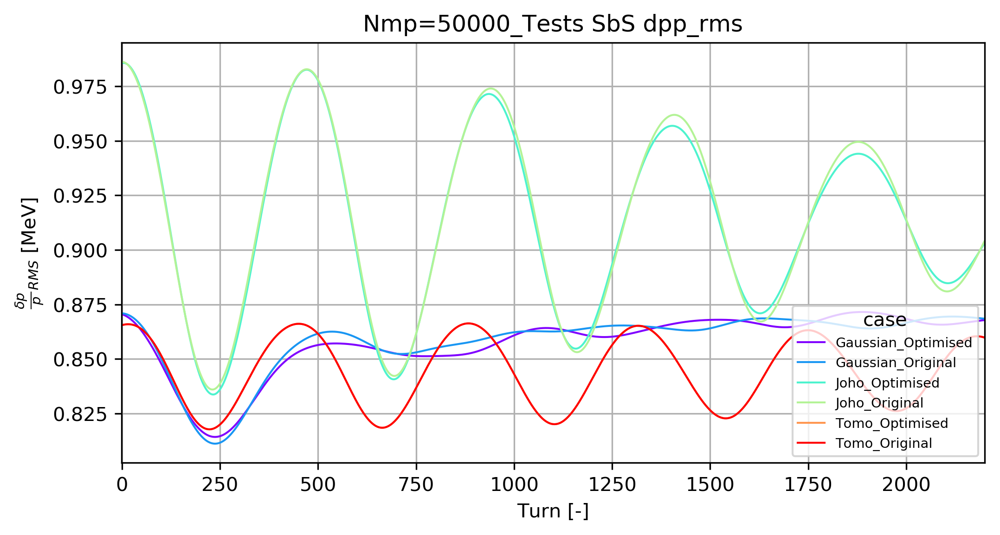

In [27]:
parameter = 'dpp_rms'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label + ' ' + sc + ' ' + parameter
ax1.set_title(tit);

ax1.set_ylabel(r'$\frac{\delta p}{p}_{RMS}$ [MeV]');
ax1.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd.keys())))
c_it = int(0)

for key, value in sorted(dd.iteritems()):
        ax1.plot(ddh[key]['turn'][0], ddh[key][parameter][0]*1000, label=key, color=colors[c_it]);
        c_it = c_it + 1
        
ax1.legend(fontsize='x-small', loc=4, title=legend_label)
ax1.grid()
ax1.set_xlim(-1,2200)

savename = 'Plots/Param_' + parameter + '_H.png'
plt.savefig(savename, dpi = 800);

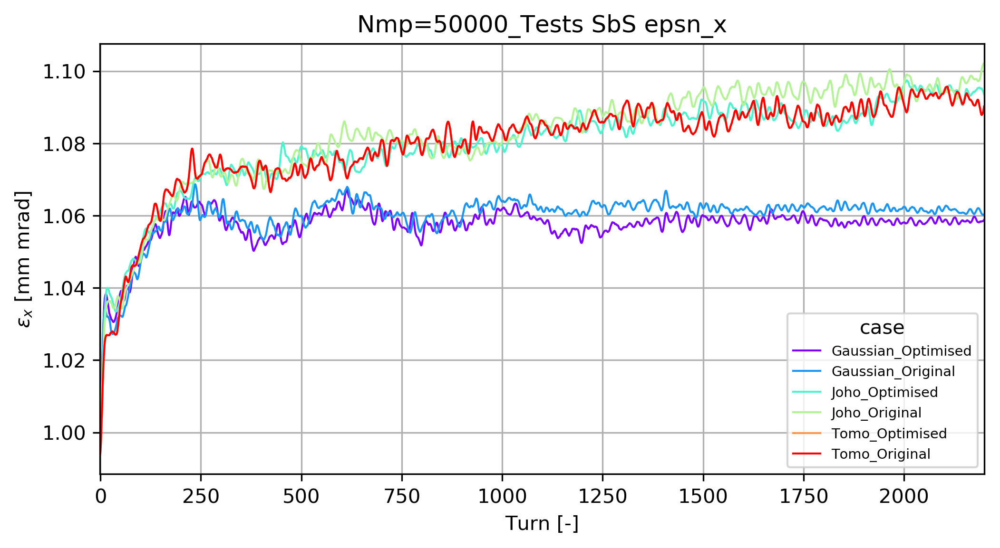

In [28]:
parameter = 'epsn_x'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label + ' ' + sc + ' ' + parameter
ax1.set_title(tit);

ax1.set_ylabel(r'$\epsilon_x$ [mm mrad]');
ax1.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd.keys())))
c_it = int(0)

for key, value in sorted(dd.iteritems()):
        ax1.plot(ddh[key]['turn'][0], ddh[key][parameter][0]*1E6, label=key, color=colors[c_it]);
        c_it = c_it + 1
        
ax1.legend(fontsize='x-small', loc=4, title=legend_label)
ax1.grid()
ax1.set_xlim(-1,2200)
#ax1.set_ylim(1.198, 1.21)

savename = 'Plots/Param_' + parameter + '_H.png'
plt.savefig(savename, dpi = 800);

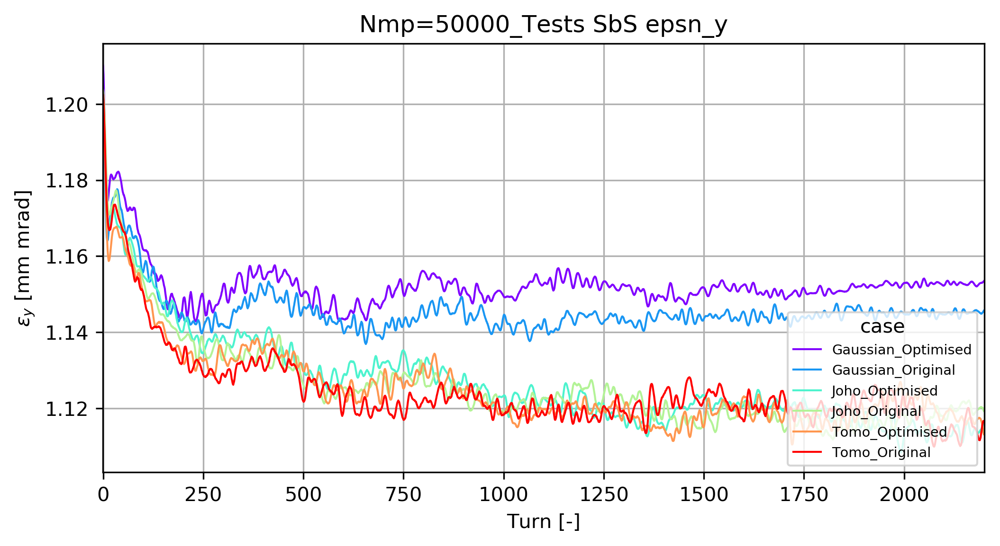

In [29]:
parameter = 'epsn_y'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label + ' ' + sc + ' ' + parameter
ax1.set_title(tit);

ax1.set_ylabel(r'$\epsilon_y$ [mm mrad]');
ax1.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd.keys())))
c_it = int(0)

for key, value in sorted(dd.iteritems()):
        ax1.plot(dd[key]['turn'][0], dd[key][parameter][0]*1E6, label=key, color=colors[c_it]);
        c_it = c_it + 1
        
ax1.legend(fontsize='x-small', loc=4, title=legend_label)
ax1.grid()
ax1.set_xlim(-1,2200)
#ax1.set_ylim(0.8, 2.4)

savename = 'Plots/Param_' + parameter + '.png'
plt.savefig(savename, dpi = 800);